In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn 
%matplotlib inline

## Load the Dataset

In [23]:
dataset = pd.read_csv("datasets/weather_data.csv")

In [24]:
dataset.head()

,date_time,maxtempC,mintempC,totalSnow_cm,sunHour,uvIndex,uvIndex.1,moon_illumination,moonrise,moonset,...,WindChillC,WindGustKmph,cloudcover,humidity,precipMM,pressure,tempC,visibility,winddirDegree,windspeedKmph
0,2009-01-01 00:00:00,22,9,0.0,8.7,4,1,31,10:11 AM,09:57 PM,...,14,19,0,50,0.0,1016,10,10,331,12
1,2009-01-01 01:00:00,22,9,0.0,8.7,4,1,31,10:11 AM,09:57 PM,...,13,21,0,51,0.0,1016,10,10,329,13
2,2009-01-01 02:00:00,22,9,0.0,8.7,4,1,31,10:11 AM,09:57 PM,...,12,22,0,52,0.0,1016,9,10,327,13
3,2009-01-01 03:00:00,22,9,0.0,8.7,4,1,31,10:11 AM,09:57 PM,...,11,23,0,54,0.0,1016,9,10,326,13
4,2009-01-01 04:00:00,22,9,0.0,8.7,4,1,31,10:11 AM,09:57 PM,...,11,21,2,52,0.0,1016,9,10,318,13


## Preparing the Dataset

In [25]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96432 entries, 0 to 96431
Data columns (total 25 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   date_time          96432 non-null  object 
 1   maxtempC           96432 non-null  int64  
 2   mintempC           96432 non-null  int64  
 3   totalSnow_cm       96432 non-null  float64
 4   sunHour            96432 non-null  float64
 5   uvIndex            96432 non-null  int64  
 6   uvIndex.1          96432 non-null  int64  
 7   moon_illumination  96432 non-null  int64  
 8   moonrise           96432 non-null  object 
 9   moonset            96432 non-null  object 
 10  sunrise            96432 non-null  object 
 11  sunset             96432 non-null  object 
 12  DewPointC          96432 non-null  int64  
 13  FeelsLikeC         96432 non-null  int64  
 14  HeatIndexC         96432 non-null  int64  
 15  WindChillC         96432 non-null  int64  
 16  WindGustKmph       964

In [26]:
# summarizing the stats of the data
dataset.describe()

,maxtempC,mintempC,totalSnow_cm,sunHour,uvIndex,uvIndex.1,moon_illumination,DewPointC,FeelsLikeC,HeatIndexC,WindChillC,WindGustKmph,cloudcover,humidity,precipMM,pressure,tempC,visibility,winddirDegree,windspeedKmph
count,96432.000000,96432.000000,96432.0,96432.000000,96432.000000,96432.000000,96432.000000,96432.000000,96432.000000,96432.000000,96432.000000,96432.000000,96432.000000,96432.000000,96432.000000,96432.000000,96432.000000,96432.000000,96432.000000,96432.000000
mean,32.681434,21.505475,0.0,11.213489,6.736685,4.390316,46.094077,12.170929,30.486270,30.608543,29.072569,11.983501,14.485119,41.323254,0.032072,1006.972333,26.672484,9.913307,214.948689,8.795151
std,7.479931,8.245626,0.0,2.155831,1.656212,3.372834,31.249725,8.049545,9.853813,9.708888,8.581811,6.182597,20.518663,21.351832,0.287923,7.789316,8.917470,0.992465,101.676151,4.329033
min,12.000000,1.000000,0.0,3.800000,3.000000,1.000000,0.000000,-22.000000,4.000000,5.000000,4.000000,0.000000,0.000000,2.000000,0.000000,987.000000,0.000000,0.000000,0.000000,0.000000
25%,26.000000,14.000000,0.0,8.700000,5.000000,1.000000,18.000000,6.000000,23.000000,24.000000,23.000000,7.000000,0.000000,24.000000,0.000000,1000.000000,20.000000,10.000000,116.000000,6.000000
50%,34.000000,23.000000,0.0,11.600000,7.000000,5.000000,46.000000,11.000000,31.000000,31.000000,30.000000,11.000000,5.000000,38.000000,0.000000,1007.000000,28.000000,10.000000,259.000000,8.000000
75%,38.000000,28.000000,0.0,13.200000,8.000000,8.000000,73.000000,20.000000,38.000000,38.000000,35.000000,16.000000,21.000000,56.000000,0.000000,1014.000000,33.000000,10.000000,303.000000,11.000000
max,52.000000,43.000000,0.0,14.000000,11.000000,11.000000,100.000000,30.000000,65.000000,65.000000,54.000000,72.000000,100.000000,100.000000,17.600000,1025.000000,51.000000,20.000000,360.000000,44.000000


In [27]:
# check for missing values
dataset.isnull().sum()

date_time            0
maxtempC             0
mintempC             0
totalSnow_cm         0
sunHour              0
uvIndex              0
uvIndex.1            0
moon_illumination    0
moonrise             0
moonset              0
sunrise              0
sunset               0
DewPointC            0
FeelsLikeC           0
HeatIndexC           0
WindChillC           0
WindGustKmph         0
cloudcover           0
humidity             0
precipMM             0
pressure             0
tempC                0
visibility           0
winddirDegree        0
windspeedKmph        0
dtype: int64

## Analyze the Correlated Features

In [28]:
# Exploratory Data Analysis
# Correlation 

dataset.corr()

C:\Users\anand\AppData\Local\Temp\ipykernel_17420\187686257.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  dataset.corr()


,maxtempC,mintempC,totalSnow_cm,sunHour,uvIndex,uvIndex.1,moon_illumination,DewPointC,FeelsLikeC,HeatIndexC,WindChillC,WindGustKmph,cloudcover,humidity,precipMM,pressure,tempC,visibility,winddirDegree,windspeedKmph
maxtempC,1.000000,0.904011,NaN,0.761986,0.953172,0.257897,-0.019194,0.309517,0.859320,0.858287,0.889433,-0.026077,0.002285,-0.404611,-0.007834,-0.827979,0.883872,0.071757,-0.106657,0.122882
mintempC,0.904011,1.000000,NaN,0.697458,0.928971,0.239402,-0.017600,0.518851,0.877688,0.876637,0.848698,-0.063537,0.213155,-0.197383,0.054795,-0.865035,0.885752,0.001572,-0.199469,0.123392
totalSnow_cm,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sunHour,0.761986,0.697458,NaN,1.000000,0.722372,0.201838,-0.012363,0.379462,0.689808,0.690751,0.656868,0.054093,0.049861,-0.146570,-0.011405,-0.780354,0.682521,0.055576,-0.104622,0.164623
uvIndex,0.953172,0.928971,NaN,0.722372,1.000000,0.250863,-0.030658,0.349051,0.852274,0.851187,0.871310,-0.049359,0.024040,-0.369734,-0.009184,-0.809576,0.877822,0.080708,-0.122081,0.120575
uvIndex.1,0.257897,0.239402,NaN,0.201838,0.250863,1.000000,-0.006164,0.045168,0.516326,0.516132,0.537442,-0.056327,0.002247,-0.372572,-0.012228,-0.230663,0.545217,0.059366,0.088448,0.149831
moon_illumination,-0.019194,-0.017600,NaN,-0.012363,-0.030658,-0.006164,1.000000,-0.009164,-0.016914,-0.017231,-0.016695,0.018431,0.019662,0.005471,0.025907,-0.008146,-0.018702,0.005721,0.007673,0.017121
DewPointC,0.309517,0.518851,NaN,0.379462,0.349051,0.045168,-0.009164,1.000000,0.486431,0.489473,0.305955,-0.190694,0.453343,0.613767,0.139566,-0.564694,0.358365,-0.169735,-0.382558,-0.098646
FeelsLikeC,0.859320,0.877688,NaN,0.689808,0.852274,0.516326,-0.016914,0.486431,1.000000,0.998785,0.963866,-0.157182,0.106265,-0.302888,0.030498,-0.834502,0.959267,0.014399,-0.132940,0.082169
HeatIndexC,0.858287,0.876637,NaN,0.690751,0.851187,0.516132,-0.017231,0.489473,0.998785,1.000000,0.961793,-0.153701,0.105421,-0.298540,0.030085,-0.834647,0.957643,0.014947,-0.132480,0.084915


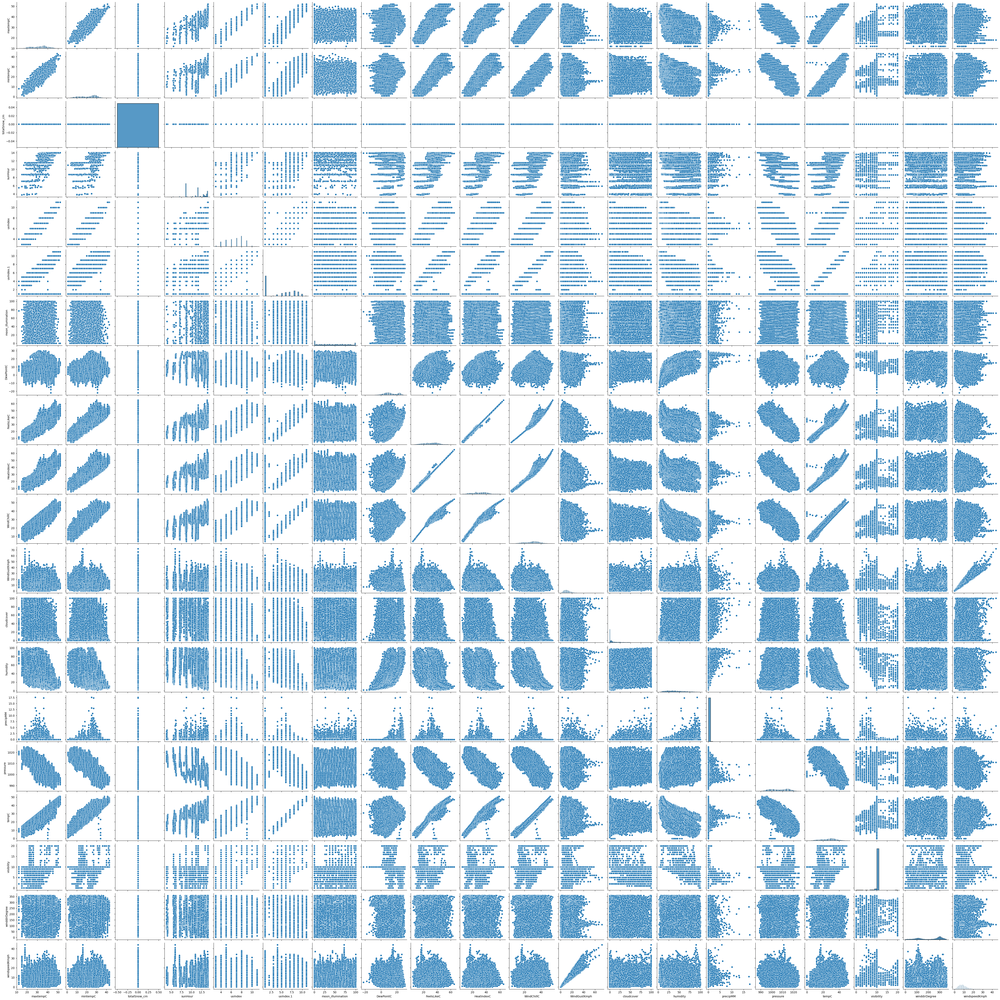

In [29]:
import seaborn as sns
sns.pairplot(dataset)

Text(0, 0.5, 'Actual Temperature')

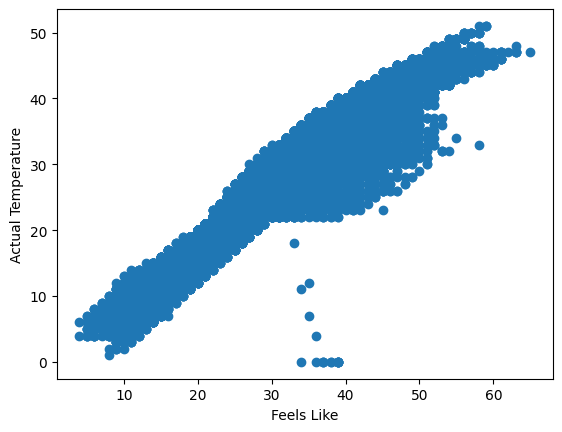

In [30]:
plt.scatter(dataset['FeelsLikeC'], dataset['tempC'])
plt.xlabel('Feels Like')
plt.ylabel('Actual Temperature')

Text(0, 0.5, 'Actual Temperature')

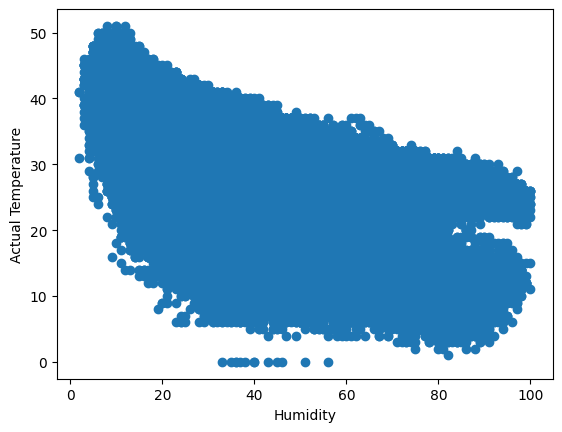

In [31]:
plt.scatter(dataset['humidity'], dataset['tempC'])
plt.xlabel('Humidity')
plt.ylabel('Actual Temperature')

Text(0, 0.5, 'Actual Temperature')

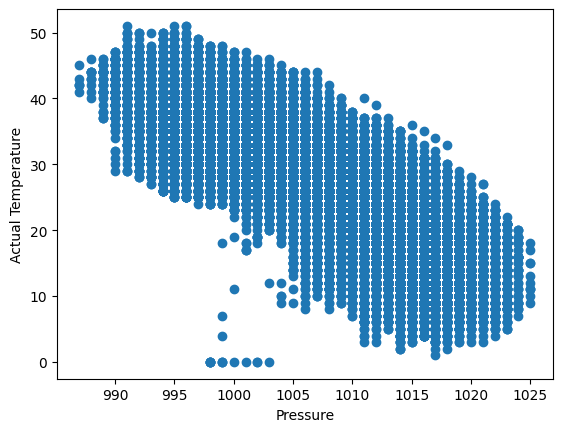

In [32]:
plt.scatter(dataset['pressure'], dataset['tempC'])
plt.xlabel('Pressure')
plt.ylabel('Actual Temperature')

### Creating a Regression Plot

<AxesSubplot: xlabel='FeelsLikeC', ylabel='tempC'>

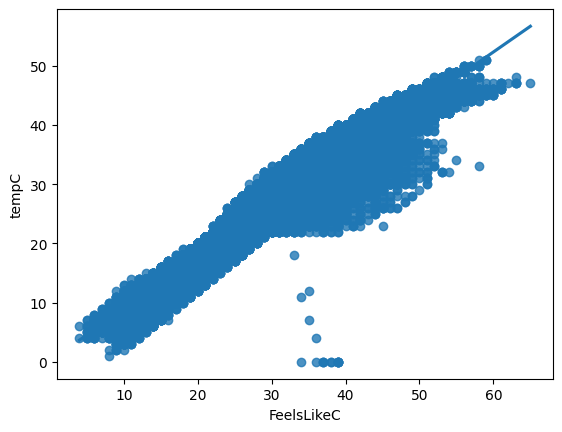

In [33]:
sns.regplot(x = 'FeelsLikeC', y = 'tempC', data = dataset)
# i.e feels like is directly proportional to actual temperature

<AxesSubplot: xlabel='humidity', ylabel='tempC'>

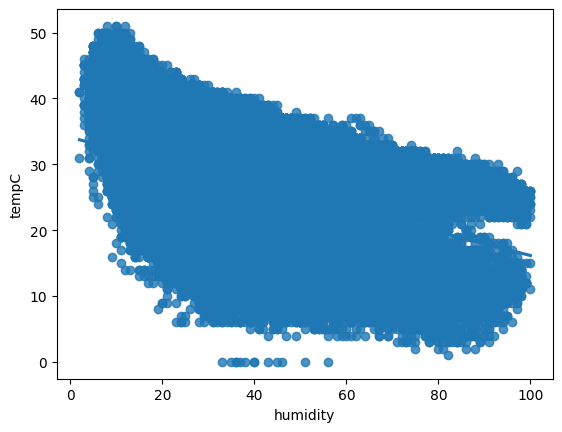

In [34]:
sns.regplot(x = 'humidity', y = 'tempC', data = dataset)

<AxesSubplot: xlabel='windspeedKmph', ylabel='tempC'>

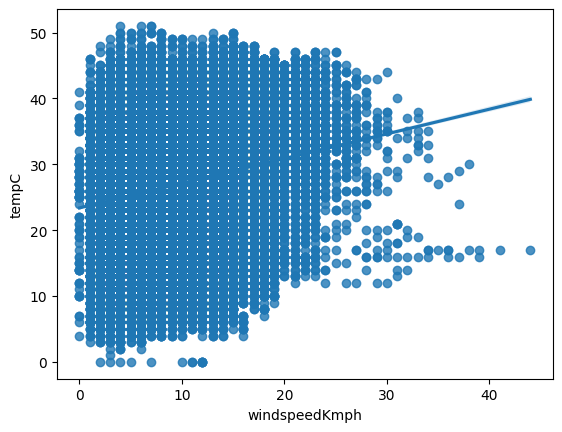

In [35]:
sns.regplot(x = 'windspeedKmph', y = 'tempC', data = dataset)

<AxesSubplot: xlabel='visibility', ylabel='tempC'>

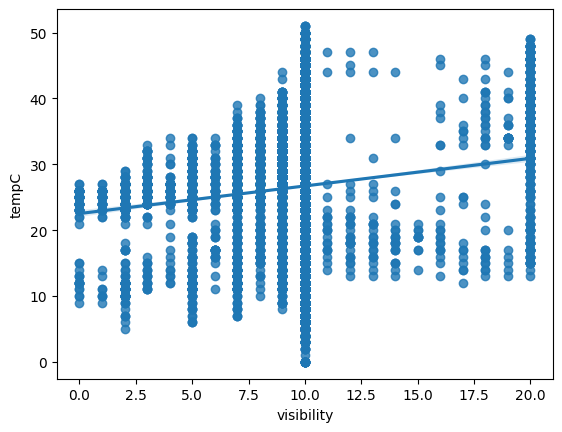

In [36]:
sns.regplot(x = 'visibility', y = 'tempC', data = dataset)

In [37]:
# After careful consideration, we have selected 'FeelsLikeC', 'humidity', 'windspeedKmph', 'visibility','pressure'
# as the input columns

## Preparing the Model

In [42]:
X = dataset.loc[:, ['FeelsLikeC', 'humidity', 'windspeedKmph', 'visibility','pressure']]
y = dataset.loc[:, ['tempC']]

In [43]:
X.head()

,FeelsLikeC,humidity,windspeedKmph,visibility,pressure
0,14,50,12,10,1016
1,13,51,13,10,1016
2,12,52,13,10,1016
3,11,54,13,10,1016
4,11,52,13,10,1016


In [44]:
y.head()

,tempC
0,10
1,10
2,9
3,9
4,9


In [45]:
# train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)

In [47]:
X_train.head()

,FeelsLikeC,humidity,windspeedKmph,visibility,pressure
60223,28,23,5,10,1013
26034,18,45,6,10,1017
44784,13,63,7,10,1012
31402,41,48,5,10,999
39394,45,38,12,10,997


In [48]:
y_train.head()

,tempC
60223,25
26034,13
44784,7
31402,34
39394,38


In [49]:
# standardize the dataset
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [50]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)

In [51]:
X_train

array([[-0.25149352, -0.85844248, -0.87258742,  0.08703785,  0.7733786 ],
       [-1.26434577,  0.17074347, -0.64122229,  0.08703785,  1.28612216],
       [-1.77077189,  1.01280471, -0.40985717,  0.08703785,  0.6451927 ],
       ...,
       [ 0.25493261, -0.62453658, -1.10395254,  0.08703785,  0.13244913],
       [-1.16306054,  0.31108701,  0.97833357,  0.08703785,  0.7733786 ],
       [-0.25149352,  2.08877185, -1.10395254,  0.08703785, -0.12392265]])

In [52]:
X_test

array([[ 2.55509070e-01,  1.96010403e+00, -6.56105342e-01,
         8.81486684e-02, -7.71169215e-01],
       [-1.06987617e+00,  3.47292401e-02,  4.94796137e-01,
         8.81486684e-02,  1.29030567e+00],
       [-4.58159907e-01, -6.69676171e-01, -1.57682653e+00,
         8.81486684e-02,  1.88386596e-03],
       ...,
       [ 8.67225336e-01, -1.18624014e+00, -1.34664623e+00,
         8.81486684e-02, -6.42327035e-01],
       [ 1.07113076e+00,  5.51293208e-01,  1.41551732e+00,
        -9.44715235e-01, -1.02885357e+00],
       [-9.67923462e-01,  3.16491404e-01,  9.55156728e-01,
         8.81486684e-02,  1.67683221e+00]])

## Training The Model

In [53]:
from sklearn.linear_model import LinearRegression

In [54]:
model = LinearRegression()

In [55]:
model.fit(X_train, y_train)

LinearRegression()

In [57]:
# print the coefficients and the intercept
print(model.coef_)

[[ 7.44651554 -1.44920326  0.69109087 -0.05979121 -0.75871078]]


In [58]:
print(model.intercept_)

[26.66635063]


In [60]:
# the parameters on which the model has been trained
model.get_params()

{'copy_X': True,
 'fit_intercept': True,
 'n_jobs': None,
 'normalize': 'deprecated',
 'positive': False}

## Predict the Data

In [62]:
reg_predict = model.predict(X_test)

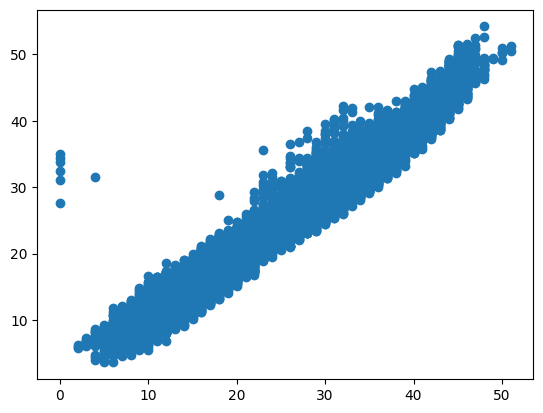

In [63]:
# scatter plot for the prediction
plt.scatter(y_test, reg_predict)

In [65]:
# prediction with the residuals
residuals = y_test - reg_predict

In [66]:
residuals

,tempC
5998,0.145191
43035,-2.006881
80788,1.871278
50586,0.757412
56855,-0.476796
...,...
82046,-3.134134
39179,-0.334077
29693,-1.394676
84539,-1.658946


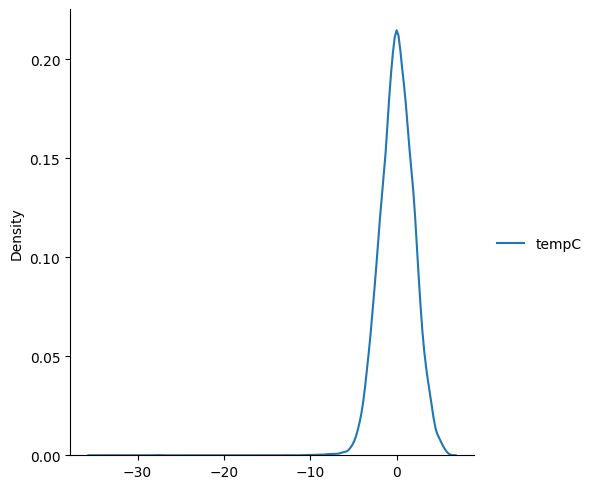

In [67]:
# plot the residuals
sns.displot(residuals, kind = "kde")

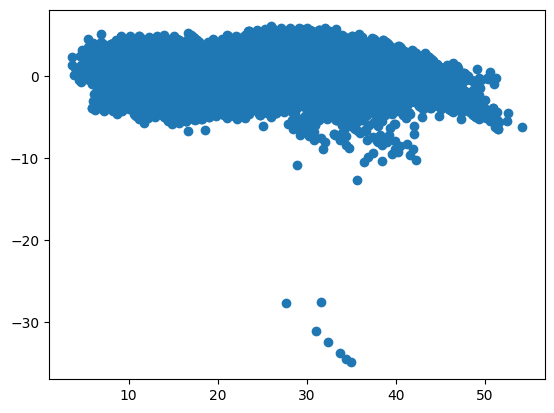

In [68]:
# scatter plot of prediction with residuals
# uniform distribution 
plt.scatter(reg_predict, residuals)

## Check the Performance of Our Model

In [70]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

In [72]:
print(mean_absolute_error(y_test, reg_predict))
print(mean_squared_error(y_test, reg_predict))
print(np.sqrt(mean_squared_error(y_test, reg_predict)))

1.5399150273553504
3.9873960617297928
1.9968465293381443


### R-square and adjusted R-Square
Formula

##### R^2 = 1 - SSR/SST

R^2 = coefficient of determination SSR = sum of squares of residuals SST = total sum of squares

In [74]:
from sklearn.metrics import r2_score

In [75]:
score = r2_score(y_test, reg_predict)
print(score)

0.9494124418840991


#### Adjusted R2 = 1 – [(1-R2)*(n-1)/(n-k-1)]

where:

R2: The R2 of the model n: The number of observations k: The number of predictor variables

In [77]:
#display adjusted R-squared
1 - (1-score)*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1)

0.9494036969736241

## Pickling the Model File for Deployment

In [80]:
import pickle

In [81]:
pickle.dump(scaler, open('scaling.pkl', 'wb'))

In [82]:
X_train

array([[-0.25149352, -0.85844248, -0.87258742,  0.08703785,  0.7733786 ],
       [-1.26434577,  0.17074347, -0.64122229,  0.08703785,  1.28612216],
       [-1.77077189,  1.01280471, -0.40985717,  0.08703785,  0.6451927 ],
       ...,
       [ 0.25493261, -0.62453658, -1.10395254,  0.08703785,  0.13244913],
       [-1.16306054,  0.31108701,  0.97833357,  0.08703785,  0.7733786 ],
       [-0.25149352,  2.08877185, -1.10395254,  0.08703785, -0.12392265]])

In [85]:
pickle.dump(model, open('regmodel.pkl', 'wb'))

In [86]:
pickled_model = pickle.load(open('regmodel.pkl', 'rb'))

In [92]:
# prediction with the pickled model
pickled_model.predict(dataset.iloc[0])

ValueError: could not convert string to float: '2009-01-01 00:00:00'